<h1 style="text-align:center; font-size: 40px;">Using Aliasing To Manpipulate A Noisy and Clean 600kHz Signal</h1>


<h5 style="text-align:center; margin-bottom: 1px;">Makaio Jimenez</h5>
<h5 style="text-align:center; margin-bottom: 1px;">K-MEX</h5>
<h5 style="text-align:center; margin-bottom: 1px;">Febuary 6, 2026</h6>
<h5 style="text-align:center; margin-bottom: 1px;">Role: Data Collector, Programmer</h6>

<h1 style="text-align:center;">Abstract</h1>


In order to explore the characteristics of our universe, one must first understand the relationships and phenomena of basic signals and the properties they can represent. This notebook explores the ideas behind these basic signals and our processes required to utilize them based on theoretical models. With the usage of various signal generators and distinct combination of accessories such as a software defined radio (SDR), a dual sideband mixer (DSB), a noise generator, etc., we were able to investigate Nyquist sampling with applied forceful aliasing along with signal alysis using Fourier transforms and mathmatical theorems. In specificity and for the sake of independent analysis, we solidified a goal that would allow us to apply every topic of the lab in one go. Given a noisy/distorted signal, we questioned if we could utilize types of filtering and aliasing in order to restore (or perhaps recreate) data that would resemble that of the orignally produced frequencies without the unwanted artifacts.


<h1 style="text-align:center;">Introduction </h1>

Astronomers over the years have designed and developed many various forms of detectiomn systems that allow them to find objects and events that lie beyond the atmosphere. However, no matter the method chosen, the vast majority of them include some form of analyzable signal. Here, a "signal" can be represented as as a type of function and in our case, we represent ours in waveforms. In order to gain an understanding of these processes, we can utilize various pieces of equipment and replicate signals we may recieve in real world observations. One of the most important concepts is that of Nyquist sampling. In simple terms, it can be presented as the following inequality.

<h3><center> $ f_{max} >   \frac{f_s}{2}   $ </center>

<center>Where $ f_{max} $ represents the highest frequency and $f_s$ is the chosen sampling rate.</center> 

More details about Nyquist samplign will be explored in the later sections, but it can be simplified as a way to group frequencies within a certain range and divide the data. Futhermore, we will also explore hardware and software related to the previously mentioned SDR, as well as a DSB and SSB mixer, representing heterodyne processing. When we finally obtain data to be observed, we can manipulte it with Fourrier Transforms (and a combination of other functions) in order to derive a power and voltage spectra in order to visualize spectral leakage and the power spectra. From here, we are given free range as to how to explore our data. Through trial and error, we will demonstrate how to determine various components of signals, their behavior under specified restrictions, and how they influence a result

<h1><center>Methods</h1></center>

<h4>Exploring Nyquist Sampling</h4>

We begin our trials at radio astronomy with basic signal processing on a Raspberry Pi. We start by attaching an obtained SDR to the Pi's USB port and we send a signal through it with a wave generator and necessary cables. With an oscilliscope on standby (turned on and connected, but not as heavily monitored), we chose a starting frequency of 600kHz and a safe sampling rate of 1.4 MHz. We chose this frequency to avoid breaking the Nyquist limit that was seen in the Introduction section. With an accurate understanding of a clean, unaliased, signal, we continued taking data on 600 kHz at different sampling rates. We proceeded to a 1 Mhz sampling rate and this of course, breaks the Nyquist limit. Through a quick graph of the two data pieces on the same plot, we distinctly saw aliasing. This action is replicated below in the next section. From here, we tried to a 1.2 Mhz which would put us exactly at the Nyquist limit. We understand that the manually set sampling rate is not 100% exact and so we were not actually at a perfect 1.2 Mhz. Nevertheless, we wanted to see what would happen. Again, that data is presented below. Finally, we tried a sampling rate that way too safe, 3.2 Mhz. We wanted to try this sampling rate because it would have put us in the next sampling zone since 3.2 Mhz > 2 * 2.4 Mhz. After these inital test trials, we decided to follow this trend for sampling rates: below the limit, at the limit, above the limit, and way above the limit. For the following frequencies, we applied these sample rates to: 600 kHz, 700 kHz, and 800 kHz.

From here, we chose the 600 kHz as our common test sample and we applied all processes in relation to it. 

# Interpretation

In [1]:
#Importing Packages
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from scipy.optimize import curve_fit
from scipy.stats import norm

mpl.rcParams["font.family"] = "Times New Roman"

#Below is my personally made package
import mak_pkg as mk

<h3><center>Prefix Context Table

<center>
ab = Above Limit <br>
bl = Below Limit <br>
at = At Limit <br>
wal = Way Above Limit <br>
N = Noisy <br>
v = Voltage Spectrum
    



</center>


<h3>Data For 600 kHz

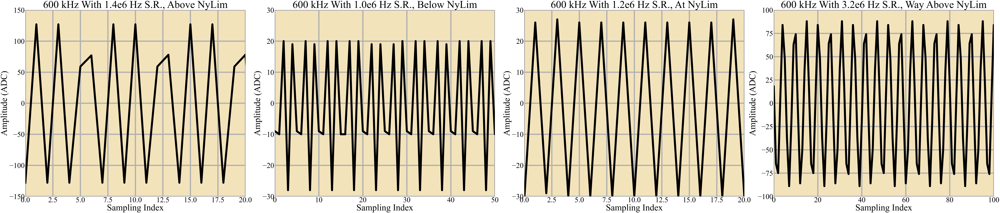

In [2]:
ab_file600 = mk.read_data("above_lim_600khz.npz",1)
bl_file600 = mk.read_data("below_lim_600khz.npz",1)
at_file600 = mk.read_data("ny_lim_600khz.npz",1)
wal_file600 = mk.read_data("way_above_lim_600khz.npz",1)



fig, axs = plt.subplots(1,4, figsize = (140,30))




########################################
#plotting the above data

#initial plot
axs[0].plot(ab_file600, color  = "black", linewidth = 20)

#naming
axs[0].set_xlabel("Sampling Index", fontsize = 90)
axs[0].set_ylabel("Amplitude (ADC)", fontsize = 90)
axs[0].set_title("600 kHz With 1.4e6 Hz S.R., Above NyLim", fontsize = 105)
#restrictions
axs[0].set_xlim(0,20)
axs[0].set_ylim(-150,150)

#aesthetic
axs[0].tick_params(axis = "both", labelsize = 75)
axs[0].grid(linewidth = 12)
axs[0].patch.set_facecolor("goldenrod")
axs[0].patch.set_alpha(0.3)

########################################
#plotting the bl data

#initial plot
axs[1].plot(bl_file600, color  = "black", linewidth = 20)

#naming
axs[1].set_xlabel("Sampling Index", fontsize = 90)
axs[1].set_ylabel("Amplitude (ADC)", fontsize = 90)
axs[1].set_title("600 kHz With 1.0e6 Hz S.R., Below NyLim", fontsize = 105)
#restrictions
axs[1].set_xlim(0,50)
axs[1].set_ylim(-30,30)

#aesthetic
axs[1].tick_params(axis = "both", labelsize = 75)
axs[1].grid(linewidth = 12)
axs[1].patch.set_facecolor("goldenrod")
axs[1].patch.set_alpha(0.3)


########################################
#plotting the at data

#initial plot
axs[2].plot(at_file600, color  = "black", linewidth = 20)

#naming
axs[2].set_xlabel("Sampling Index", fontsize = 90)
axs[2].set_ylabel("Amplitude (ADC)", fontsize = 90)
axs[2].set_title("600 kHz With 1.2e6 Hz S.R., At NyLim", fontsize = 105)
#restrictions
axs[2].set_xlim(0,20)
axs[2].set_ylim(-30,30)

#aesthetic
axs[2].tick_params(axis = "both", labelsize = 75)
axs[2].grid(linewidth = 12)
axs[2].patch.set_facecolor("goldenrod")
axs[2].patch.set_alpha(0.3)



########################################
#plotting the way above data

#initial plot
axs[3].plot(wal_file600, color  = "black", linewidth = 20)

#naming
axs[3].set_xlabel("Sampling Index", fontsize = 90)
axs[3].set_ylabel("Amplitude (ADC)", fontsize = 90)
axs[3].set_title("600 kHz With 3.2e6 Hz S.R., Way Above NyLim", fontsize = 105)
#restrictions
axs[3].set_xlim(0,100)
axs[3].set_ylim(-100,100)

#aesthetic
axs[3].tick_params(axis = "both", labelsize = 75)
axs[3].grid(linewidth = 12)
axs[3].patch.set_facecolor("goldenrod")
axs[3].patch.set_alpha(0.3)





########################################


plt.tight_layout()
plt.show()

This is our data for 600 kHz. As you can see, each individual condition brings about a very distinct pattern in the waveform. Our first signal at an 1.4e6 Hz sample rate gives us a pattern of 

<h3>Data for 700 kHz

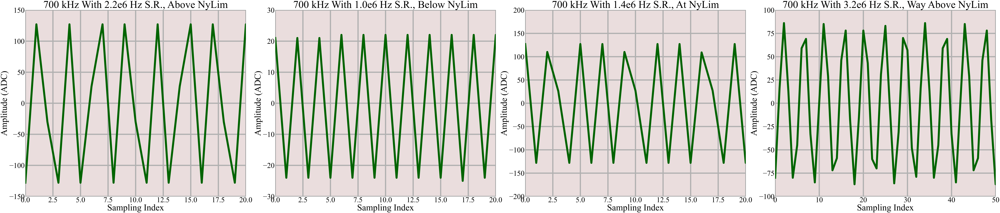

In [3]:
ab_file700 = mk.read_data("above_lim_700khz.npz",1)
bl_file700 = mk.read_data("below_lim_700khz.npz",1)
at_file700 = mk.read_data("ny_lim_700khz.npz",1)
wal_file700 = mk.read_data("way_above_lim_700khz.npz",1)



fig, axs = plt.subplots(1,4, figsize = (140,30))




########################################
#plotting the above data

#initial plot
axs[0].plot(ab_file700, color  = "darkgreen", linewidth = 20)

#naming
axs[0].set_xlabel("Sampling Index", fontsize = 90)
axs[0].set_ylabel("Amplitude (ADC)", fontsize = 90)
axs[0].set_title("700 kHz With 2.2e6 Hz S.R., Above NyLim", fontsize = 105)
#restrictions
axs[0].set_xlim(0,20)
axs[0].set_ylim(-150,150)

#aesthetic
axs[0].tick_params(axis = "both", labelsize = 75)
axs[0].grid(linewidth = 12)
axs[0].patch.set_facecolor("rosybrown")
axs[0].patch.set_alpha(0.3)

########################################
#plotting the below data

#initial plot
axs[1].plot(bl_file700, color  = "darkgreen", linewidth = 20)

#naming
axs[1].set_xlabel("Sampling Index", fontsize = 90)
axs[1].set_ylabel("Amplitude (ADC)", fontsize = 90)
axs[1].set_title("700 kHz With 1.0e6 Hz S.R., Below NyLim", fontsize = 105)
#restrictions
axs[1].set_xlim(0,20)
axs[1].set_ylim(-30,30)

#aesthetic
axs[1].tick_params(axis = "both", labelsize = 75)
axs[1].grid(linewidth = 12)
axs[1].patch.set_facecolor("rosybrown")
axs[1].patch.set_alpha(0.3)


########################################
#plotting the at data

#initial plot
axs[2].plot(at_file700, color  = "darkgreen", linewidth = 20)

#naming
axs[2].set_xlabel("Sampling Index", fontsize = 90)
axs[2].set_ylabel("Amplitude (ADC)", fontsize = 90)
axs[2].set_title("700 kHz With 1.4e6 Hz S.R., At NyLim", fontsize = 105)
#restrictions
axs[2].set_xlim(0,20)
axs[2].set_ylim(-200,200)

#aesthetic
axs[2].tick_params(axis = "both", labelsize = 75)
axs[2].grid(linewidth = 12)
axs[2].patch.set_facecolor("rosybrown")
axs[2].patch.set_alpha(0.3)



########################################
#plotting the way above data

#initial plot
axs[3].plot(wal_file700, color  = "darkgreen", linewidth = 20)

#naming
axs[3].set_xlabel("Sampling Index", fontsize = 90)
axs[3].set_ylabel("Amplitude (ADC)", fontsize = 90)
axs[3].set_title("700 kHz With 3.2e6 Hz S.R., Way Above NyLim", fontsize = 105)
#restrictions
axs[3].set_xlim(0,50)
axs[3].set_ylim(-100,100)

#aesthetic
axs[3].tick_params(axis = "both", labelsize = 75)
axs[3].grid(linewidth = 12)
axs[3].patch.set_facecolor("rosybrown")
axs[3].patch.set_alpha(0.3)





########################################


plt.tight_layout()
plt.show()

<h3>800 kHz data</h3>

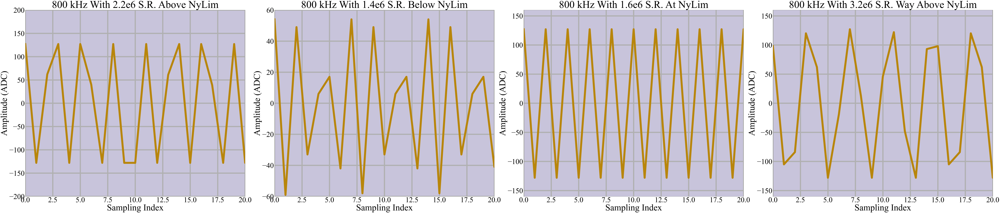

In [4]:
ab_file800 = mk.read_data("above_lim_800khz.npz",1)
bl_file800 = mk.read_data("below_lim_800khz.npz",1)
at_file800 = mk.read_data("ny_lim_800khz.npz",1)
wal_file800 = mk.read_data("way_above_lim_800khz.npz",1)


fig, ax = plt.subplots(1,4, figsize = (140,30))


########################################
#plotting the above data


mk.freq_plots(ax, 0, 800, "800 kHz With 2.2e6 S.R. Above NyLim", varName = ab_file800, background_col = "darkslateblue", wave_col = "darkgoldenrod", ylim0 = -200, ylim1 = 200, xlabel = "Sampling Index", ylabel = "Amplitude (ADC)")

              
########################################
#plotting the below data
    
mk.freq_plots(ax, 1, 800, title = "800 kHz With 1.4e6 S.R. Below NyLim", varName = bl_file800, background_col = "darkslateblue", wave_col = "darkgoldenrod", ylim0 = -60, ylim1 = 60, xlabel = "Sampling Index", ylabel = "Amplitude (ADC)")

    

########################################
#plotting the at data

mk.freq_plots(ax, 2, 800, title = "800 kHz With 1.6e6 S.R. At NyLim", varName = at_file800, background_col = "darkslateblue", wave_col = "darkgoldenrod", ylim0 = -160, ylim1 = 160, xlabel = "Sampling Index", ylabel = "Amplitude (ADC)")


########################################
#plotting the above data

mk.freq_plots(ax, 3, 800, title = "800 kHz With 3.2e6 S.R. Way Above NyLim", varName = wal_file800, background_col = "darkslateblue", wave_col = "darkgoldenrod", ylim0 = -160, ylim1 = 160, xlabel = "Sampling Index", ylabel = "Amplitude (ADC)")


plt.tight_layout()
plt.show()

<h3>Characteristics of the SDR bandpass filter

We cannot assume that the SDR has a perfect, neutral, frequency response despite the fact that it keeps such details hidden. Within its small structure, it holds its own alias reducing mechanism. This mechanism is called a Low-Pass filter. As the name suggest, the low-pass filter allows the lower frequencies below a arbitrary threshold to be read while the signals above the threshold are discarded. In terms of the SDR, the frequencies above the Nyquist frequency are what cut off. Our SDR's actually perform this operation twice. 

In the first stages of the SDR, the R820 chip filters the iamginary and real components of the wave and then it moves onto the RTL2832 which has FIR filters that also apply a low-pass. It then proceeds to downsample and data collecion begins

<h3> The Power and Voltage Spectra

<h3>Voltage Spectra

/Users/makaio_jimenez/anaconda3/lib/python3.11/site-packages/matplotlib/cbook.py:1719: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/Users/makaio_jimenez/anaconda3/lib/python3.11/site-packages/matplotlib/cbook.py:1355: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


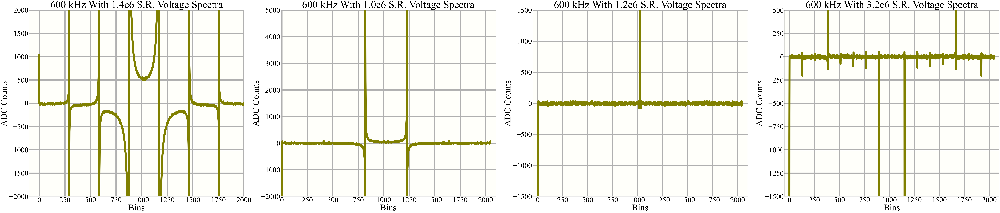

In [5]:
ab_file600 = mk.read_data("above_lim_600khz.npz",6)
bl_file600 = mk.read_data("below_lim_600khz.npz",6)
at_file600 = mk.read_data("ny_lim_600khz.npz",6)
wal_file600 = mk.read_data("way_above_lim_600khz.npz",6)

#The Voltage Spectra can be found with np.fft.fft()


fig, ax = plt.subplots(1,4, figsize = (140,30))


########################################
#plotting the above data


mk.freq_plots(ax, 0, 600, "600 kHz With 1.4e6 S.R. Voltage Spectra", varName = np.fft.fft(ab_file600), background_col = "ivory", wave_col = "olive", ylim0 = -2000, ylim1 = 2000, xlim0 = -100, xlim1 = 2000 ,xlabel = "Bins", ylabel = "ADC Counts")

              
########################################
#plotting the below data
    
mk.freq_plots(ax, 1, 600, title = "600 kHz With 1.0e6 S.R. Voltage Spectra", varName = np.fft.fft(bl_file600), background_col = "ivory", wave_col = "olive",ylim0 = -2000, ylim1 = 5000, xlim0 = -10, xlim1 = 2100, xlabel = "Bins", ylabel = "ADC Counts")

    

########################################
#plotting the at data

mk.freq_plots(ax, 2, 600, title = "600 kHz With 1.2e6 S.R. Voltage Spectra", varName = np.fft.fft(at_file600), background_col = "ivory", wave_col = "olive", ylim0 = -1500, ylim1 = 1500, xlim0 = -50, xlim1 = 2100, xlabel = "Bins", ylabel = "ADC Counts")


########################################
#plotting the above data

mk.freq_plots(ax, 3, 600, title = "600 kHz With 3.2e6 S.R. Voltage Spectra", varName = np.fft.fft(wal_file600), background_col = "ivory", wave_col = "olive", ylim0 = -1500, ylim1 = 500, xlim0 = -50, xlim1 = 2100, xlabel = "Bins", ylabel = "ADC Counts")

plt.tight_layout()
plt.show()

This is the voltage spectra. To many, this pattern shows a odd pattern, but each shape is actually an indicator of the behavior of the signal. The peaks seen in each graph represent a strong signal where the highest peaks are the fundamental frequencies. A fundamental frequency is a frequency that acts as the first base in a set of frequencies where each of the other frequencies are interger multiples of the fundamental. These integer multiples are called harmonics and can be seen as the smaller peaks throughout the graphs. Of course, this phenomena is only perfect in theory. Here, many other characteristics influence the presented frequencies such as spectral leakage. Spectral leakage is when 

We can also see aspects related to the concept of the frequency resolution defined by 

<h3><center>$\Delta f  = \frac {1}{T} $</center>

which is a concept where frequency spacing is used to determine differentiating frequency characteristics. Above, we can see spacing

<h3>Power Spectra

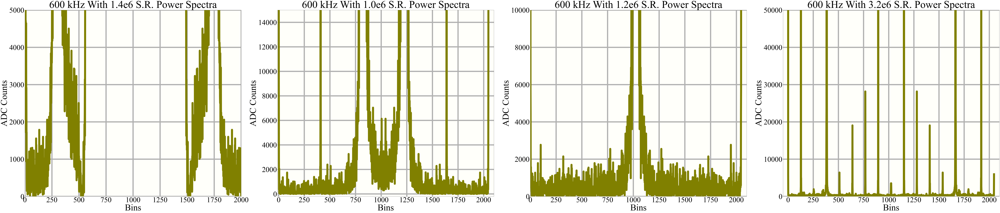

In [6]:
#The power Spectra can be found with |np.fft.fft()|**2


fig, ax = plt.subplots(1,4, figsize = (140,30))


########################################
#plotting the above data


mk.freq_plots(ax, 0, 600, "600 kHz With 1.4e6 S.R. Power Spectra", varName = (np.abs(np.fft.fft(ab_file600))**2), background_col = "ivory", wave_col = "olive", ylim0 = 0, ylim1 = 5000, xlim0 = 0, xlim1 = 2000 ,xlabel = "Bins", ylabel = "ADC Counts")

              
########################################
#plotting the below data
    
mk.freq_plots(ax, 1, 600, title = "600 kHz With 1.0e6 S.R. Power Spectra", varName = (np.abs(np.fft.fft(bl_file600)))**2, background_col = "ivory", wave_col = "olive",ylim0 = -200, ylim1 = 15000, xlim0 = -10, xlim1 = 2100, xlabel = "Bins", ylabel = "ADC Counts")

    

########################################
#plotting the at data

mk.freq_plots(ax, 2, 600, title = "600 kHz With 1.2e6 S.R. Power Spectra", varName = np.abs(np.fft.fft(at_file600))**2, background_col = "ivory", wave_col = "olive", ylim0 = 0, ylim1 = 10000, xlim0 = 0, xlim1 = 2100, xlabel = "Bins", ylabel = "ADC Counts")


########################################
#plotting the above data

mk.freq_plots(ax, 3, 600, title = "600 kHz With 3.2e6 S.R. Power Spectra", varName = np.abs(np.fft.fft(wal_file600))**2, background_col = "ivory", wave_col = "olive", ylim0 = 0, ylim1 = 50000, xlim0 = -50, xlim1 = 2100, xlabel = "Bins", ylabel = "ADC Counts")



plt.tight_layout()
plt.show()


This the power spectra. As you can see, each of the graphs have outlying peaks at certain frequency bins that elevate to drastically high values. These are the areas where the signal has the most power and it can be visualized with a sinc function which results to the following equation:

<h3><center>$sinc(x) = \frac {sin(x)}{x} $</center>

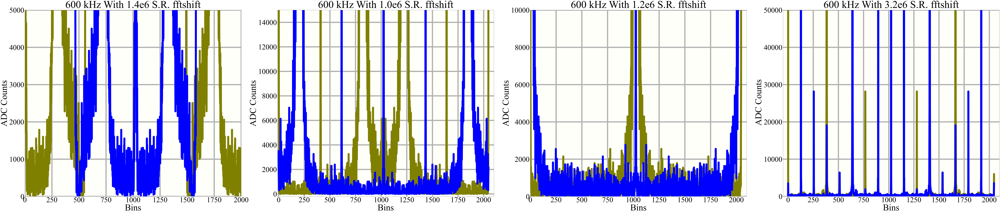

In [7]:
#The power Spectra can be found with |np.fft.fft()|**2


fig, ax = plt.subplots(1,4, figsize = (140,30))


########################################
#plotting the above data


mk.freq_plots(ax, 0, 600, "600 kHz With 1.4e6 S.R. Power Spectra", varName = (np.abs(np.fft.fft(ab_file600))**2), background_col = "ivory", wave_col = "olive", ylim0 = 0, ylim1 = 5000, xlim0 = 0, xlim1 = 2000 ,xlabel = "", ylabel = "")
mk.freq_plots(ax, 0, 600, "600 kHz With 1.4e6 S.R. fftshift", varName = np.fft.fftshift((np.abs(np.fft.fft(ab_file600))**2)), background_col = "ivory", wave_col = "blue", ylim0 = 0, ylim1 = 5000, xlim0 = 0, xlim1 = 2000 ,xlabel = "Bins", ylabel = "ADC Counts")

              
########################################
#plotting the below data
    
mk.freq_plots(ax, 1, 600, title = "600 kHz With 1.0e6 S.R. Power Spectra", varName = (np.abs(np.fft.fft(bl_file600)))**2, background_col = "ivory", wave_col = "olive",ylim0 = -200, ylim1 = 15000, xlim0 = -10, xlim1 = 2100, xlabel = "", ylabel = "")
mk.freq_plots(ax, 1, 600, title = "600 kHz With 1.0e6 S.R. fftshift", varName = np.fft.fftshift((np.abs(np.fft.fft(bl_file600)))**2), background_col = "ivory", wave_col = "blue",ylim0 = -200, ylim1 = 15000, xlim0 = -10, xlim1 = 2100, xlabel = "Bins", ylabel = "ADC Counts")

    

########################################
#plotting the at data

mk.freq_plots(ax, 2, 600, title = "600 kHz With 1.2e6 S.R. Power Spectra", varName = np.abs(np.fft.fft(at_file600))**2, background_col = "ivory", wave_col = "olive", ylim0 = 0, ylim1 = 10000, xlim0 = 0, xlim1 = 2100, xlabel = "", ylabel = "")
mk.freq_plots(ax, 2, 600, title = "600 kHz With 1.2e6 S.R. fftshift", varName = np.fft.fftshift(np.abs(np.fft.fft(at_file600))**2), background_col = "ivory", wave_col = "blue", ylim0 = 0, ylim1 = 10000, xlim0 = 0, xlim1 = 2100, xlabel = "Bins", ylabel = "ADC Counts")


########################################
#plotting the above data

mk.freq_plots(ax, 3, 600, title = "600 kHz With 3.2e6 S.R. Power Spectra", varName = np.abs(np.fft.fft(wal_file600))**2, background_col = "ivory", wave_col = "olive", ylim0 = 0, ylim1 = 50000, xlim0 = -50, xlim1 = 2100, xlabel = "Bins", ylabel = "ADC Counts")
mk.freq_plots(ax, 3, 600, title = "600 kHz With 3.2e6 S.R. fftshift", varName = np.fft.fftshift(np.abs(np.fft.fft(wal_file600))**2), background_col = "ivory", wave_col = "blue", ylim0 = 0, ylim1 = 50000, xlim0 = -50, xlim1 = 2100, xlabel = "Bins", ylabel = " ADC Counts")



plt.tight_layout()
plt.show()


<h3>Using ifft</h3>

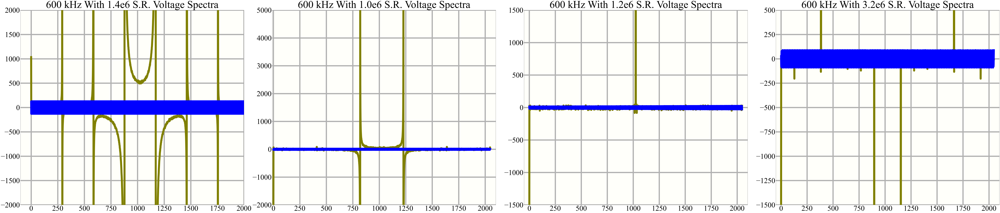

In [8]:
ab_file600 = mk.read_data("above_lim_600khz.npz",6)
bl_file600 = mk.read_data("below_lim_600khz.npz",6)
at_file600 = mk.read_data("ny_lim_600khz.npz",6)
wal_file600 = mk.read_data("way_above_lim_600khz.npz",6)

#The Voltage Spectra can be found with np.fft.fft()


fig, ax = plt.subplots(1,4, figsize = (140,30))


########################################
#plotting the above data


mk.freq_plots(ax, 0, 600, "600 kHz With 1.4e6 S.R. Voltage Spectra", varName = np.fft.fft(ab_file600), background_col = "ivory", wave_col = "olive", ylim0 = -2000, ylim1 = 2000, xlim0 = -100, xlim1 = 2000 ,xlabel = "", ylabel = "")
mk.freq_plots(ax, 0, 600, "600 kHz With 1.4e6 S.R. Voltage Spectra", varName = np.fft.ifft(np.fft.fft(ab_file600)), background_col = "ivory", wave_col = "blue", ylim0 = -2000, ylim1 = 2000, xlim0 = -100, xlim1 = 2000 ,xlabel = "", ylabel = "")

              
########################################
#plotting the below data
    
mk.freq_plots(ax, 1, 600, title = "600 kHz With 1.0e6 S.R. Voltage Spectra", varName = np.fft.fft(bl_file600), background_col = "ivory", wave_col = "olive",ylim0 = -2000, ylim1 = 5000, xlim0 = -10, xlim1 = 2100, xlabel = "", ylabel = "")
mk.freq_plots(ax, 1, 600, title = "600 kHz With 1.0e6 S.R. Voltage Spectra", varName = np.fft.ifft(np.fft.fft(bl_file600)), background_col = "ivory", wave_col = "blue",ylim0 = -2000, ylim1 = 5000, xlim0 = -10, xlim1 = 2100, xlabel = "", ylabel = "")

    

########################################
#plotting the at data

mk.freq_plots(ax, 2, 600, title = "600 kHz With 1.2e6 S.R. Voltage Spectra", varName = np.fft.fft(at_file600), background_col = "ivory", wave_col = "olive", ylim0 = -1500, ylim1 = 1500, xlim0 = -50, xlim1 = 2100, xlabel = "", ylabel = "")
mk.freq_plots(ax, 2, 600, title = "600 kHz With 1.2e6 S.R. Voltage Spectra", varName = np.fft.ifft(np.fft.fft(at_file600)), background_col = "ivory", wave_col = "blue", ylim0 = -1500, ylim1 = 1500, xlim0 = -50, xlim1 = 2100, xlabel = "", ylabel = "")


########################################
#plotting the above data

mk.freq_plots(ax, 3, 600, title = "600 kHz With 3.2e6 S.R. Voltage Spectra", varName = np.fft.fft(wal_file600), background_col = "ivory", wave_col = "olive", ylim0 = -1500, ylim1 = 500, xlim0 = -50, xlim1 = 2100, xlabel = "", ylabel = "")
mk.freq_plots(ax, 3, 600, title = "600 kHz With 3.2e6 S.R. Voltage Spectra", varName = np.fft.ifft(np.fft.fft(wal_file600)), background_col = "ivory", wave_col = "blue", ylim0 = -1500, ylim1 = 500, xlim0 = -50, xlim1 = 2100, xlabel = "", ylabel = "")

plt.tight_layout()
plt.show()

<h3>Investigating Spectral Leakage and Frequency Resolution</h3>

Within sigal processing, there exists two events known as spectral leakage and frequency resolution. Spectral leakage is an event where a signal will have frequencies that leak into neighboring frequencies. Frequency resolution is a term used to describe how each section, or "bin" differs from each other in terms of frequency. Both aspects can be found using the Fourier transform as shown above. In terms of our graphs, we can make the following statements. The 600kHz graph with a 1.4e6 S.R. 

<h3>Noise And Radiometer Equation, DSB And SSB Mixers, Heterodyne Process and Radio Astronomy </h3>

Our working question dictates that we apply a noisy signal to a clean signal. We can do this by using the same wave generator as before, but this time, along with a DSB mixer and a noise generator. This noise generator is set to an autenuation level of five. 

<h3>Noise Generator And DSB Mixer</h3>

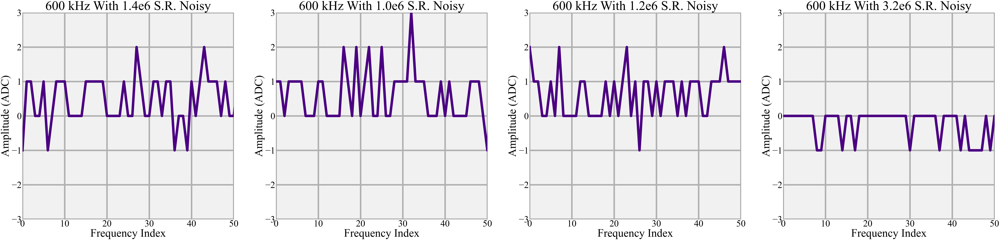

In [9]:
#import nosie signal
Nab_file600 = mk.read_data("Nabove_lim_600khz.npz",6)
Nbl_file600 = mk.read_data("Nbelow_lim_600khz.npz",6)
Nat_file600 = mk.read_data("Nny_lim_600khz.npz",6)
Nwal_file600 = mk.read_data("Nway_above_lim_600khz.npz",6)




#plotting noisy graphs
fig, ax = plt.subplots(1,4, figsize = (140,30))


mk.freq_plots(ax, 0, 600, title = "600 kHz With 1.4e6 S.R. Noisy", varName = Nab_file600, background_col = "lightgrey", wave_col = "indigo", ylim0 = -3, ylim1 = 3, xlim0 = 0, xlim1 = 50, xlabel = "Frequency Index", ylabel = "Amplitude (ADC)")

mk.freq_plots(ax, 1, 600, title = "600 kHz With 1.0e6 S.R. Noisy", varName = Nbl_file600, background_col = "lightgrey", wave_col = "indigo", ylim0 = -3, ylim1 = 3, xlim0 = 0, xlim1 = 50, xlabel = "Frequency Index", ylabel = "Amplitude (ADC)")

mk.freq_plots(ax, 2, 600, title = "600 kHz With 1.2e6 S.R. Noisy", varName = Nat_file600, background_col = "lightgrey", wave_col = "indigo", ylim0 = -3, ylim1 = 3, xlim0 = 0, xlim1 = 50, xlabel = "Frequency Index", ylabel = "Amplitude (ADC)")

mk.freq_plots(ax, 3, 600, title = "600 kHz With 3.2e6 S.R. Noisy", varName = Nwal_file600, background_col = "lightgrey", wave_col = "indigo", ylim0 = -3, ylim1 = 3, xlim0 = 0, xlim1 = 50, xlabel = "Frequency Index", ylabel = "Amplitude (ADC)")



We can test to see if the noise is truly random with a Guassian Fit

<h3>Heterodyne Process</h3>

The Heterodyne process is the act of essentially mixing two frequencies together in which it will result in a shifted frequency range and a sum of the two frequencies. In our case, we represetented this process with the previously stated noise generator + wave generator combination. This allowed us to shift our orignal 600 kHz frequencies into another range that now included added and subtracted frequencies from a noisy signal, thus creating a new waveform at different amplitudes that would either increase or decrease from the orignal. This process also allows the higher frequencies in our singal to be reduced and be viewed in lower frequencies. This is the exact reason why astronomers cherish such a phenomena. In space, there exists a huge range between the weakest of signal and the strongest of them. If a weak signal is found, such as one from an area in space with low radioactive activity, astronomers can combine that data with a stronger signal in order to boost the amplitudes of the weak counterpart. This process also works in reverse. If an area has too much radioactive activity and the frequencies pose to be too high, then applying a weaker signal will allow the data to be reduced to weaker forms such as radio waves. The Heterodyne process is also very accurate and clean, leaving minimal distortion and artifacts that may ruin the data. Due to these utilizations, astronomers tend to apply the Heterodyne process quiet frequently.  

# Conclusion

We have now explored the aspects of signals and their relationship to the functional world. Whether it be through simple Nyquist sampling, or complex Heterodyne processes, the range of signal processing is now exposed. In the eyes of an astronomer, these tools are essential to the craft as they open a door to a whole new world of data collection, even in the most dire of circumstances.